# 🧑‍🏫 Specifying IMU preprocessing parameters

In [14]:
## - Imports and configuration

import numpy as np

# - Plotting and config
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = [9.6, 3.6]
plt.rcParams["figure.dpi"] = 1200
plt.rcParams["font.size"] = 12

try:
    from rich import print
except:
    pass

from IPython.display import Image

import warnings
warnings.filterwarnings('ignore')

from rockpool.devices.xylo.syns63300 import Quantizer

## Overview of preprocessing chain modules

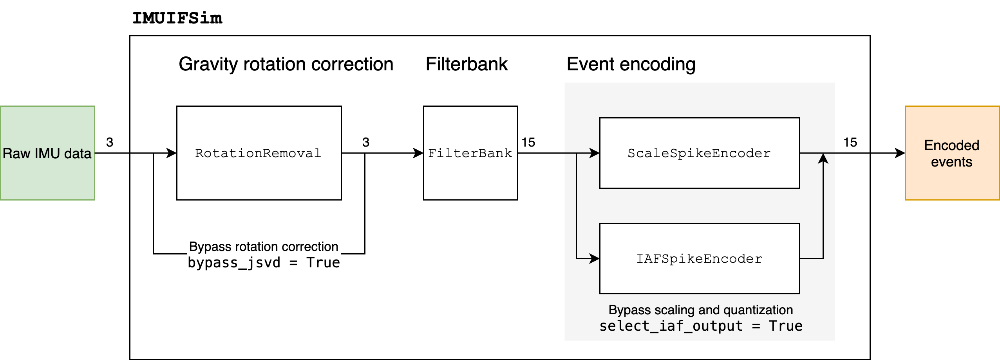

In [15]:
Image('imu-ifsim-module.png')

## Specifying rotation correction parameters

In [16]:
from rockpool.devices.xylo.syns63300.imuif import RotationRemoval

rr = RotationRemoval(
    num_avg_bitshift = 6,
    sampling_period = 50,
    )
print(rr)

RotationRemoval  with shape (3, 3) {
    ModSequential 'sub_estimate' with shape (3, 9) {
        SubSpace '0_SubSpace' with shape (3, 9)
        SampleAndHold '1_SampleAndHold' with shape (9, 9)
    }
}

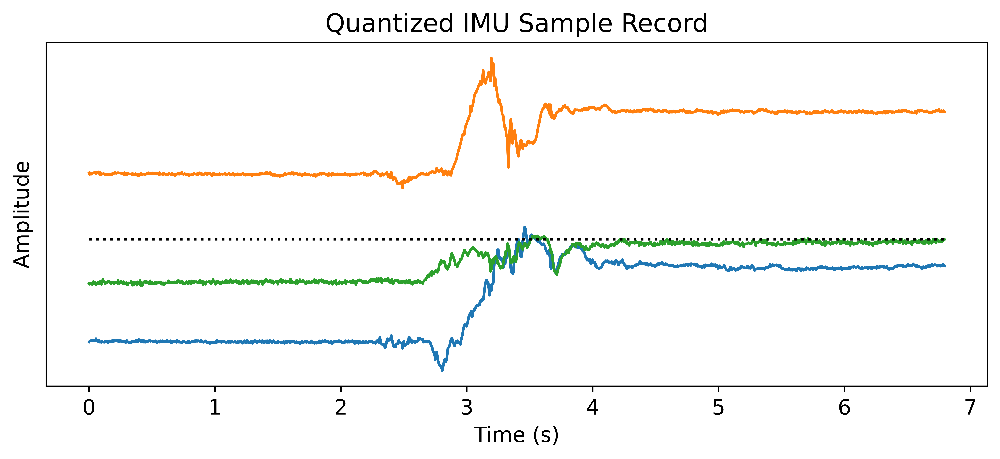

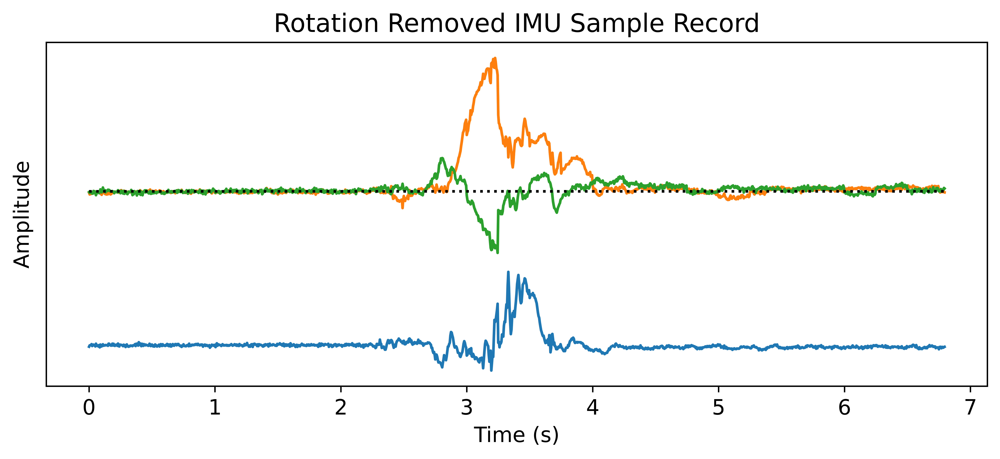

In [17]:
## - Demonstrate using an IMU data sample

# - Load a data sample and ensure it has the correct scale
with open("data.npy", "rb") as f:
    data = np.load(f)
quantizer = Quantizer(3, scale=0.49, num_bits=16)
data_quantized, _, _ = quantizer(data)

# - Apply the rotation removal correction
data_corrected, _, _ = rr(data_quantized)

# - Plot the IMU sample and rotation corrected sample
times = np.arange(len(data)) / 200.
plt.figure()
plt.plot(times, data_quantized[0])
plt.plot(times[[0, -1]], [0, 0], 'k:')
plt.yticks([])
plt.title(f"Quantized IMU Sample Record")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.figure()
plt.plot(times, data_corrected[0])
plt.plot(times[[0, -1]], [0, 0], 'k:')
plt.yticks([])
plt.title(f"Rotation Removed IMU Sample Record")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude');


## Specifying filter-bank parameters
### Specifying a single band-pass filter

In [18]:
from rockpool.devices.xylo.syns63300.imuif import FilterBank, BandPassFilter

# - Specify a band-pass from 5..10 Hz, sampling at 200 Hz
low_cut = 5. # Hz
high_cut = 10. # Hz
Fs = 200. # Hz

# - Instantiate an object for the band-pass filter
bpf = BandPassFilter.from_specification(low_cut, high_cut, Fs)
print(bpf)

BandPassFilter(B_b=3, B_wf=8, B_af=12, a1=-59258, a2=27986, scale_out=0.5836772581461334)

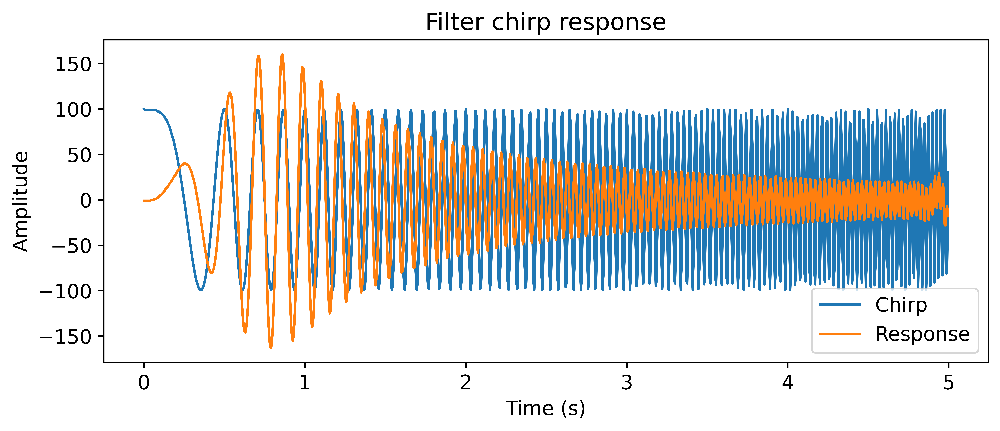

In [19]:
## - Generate and plot a chirp response

# - Import utility functions
import numpy as np
import scipy.signal as sig

# - Generate a 10-second chirp signal ranging 40..0..40 Hz
T = 5.
times = np.arange(0, int(T * Fs)) / Fs
chirp = np.array(sig.chirp(times, 0, T, 40) * 100, dtype=np.int64).astype(object)
freq = np.linspace(0, 40, len(times))

times2 = np.concatenate([times, times + times[-1]+1/Fs])
chirp2 = np.concatenate([chirp, np.flip(chirp)])
freq2 = np.concatenate([freq, np.flip(freq)])

# - Pass the signal through the filter
resp = bpf(chirp2)

# - Plot the chirp and the filter response
plt.figure()
plt.plot(times, chirp, label = 'Chirp')
plt.plot(times, np.flip(resp[len(times)-1:-1]), label = 'Response')
plt.legend()
plt.title('Filter chirp response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude');

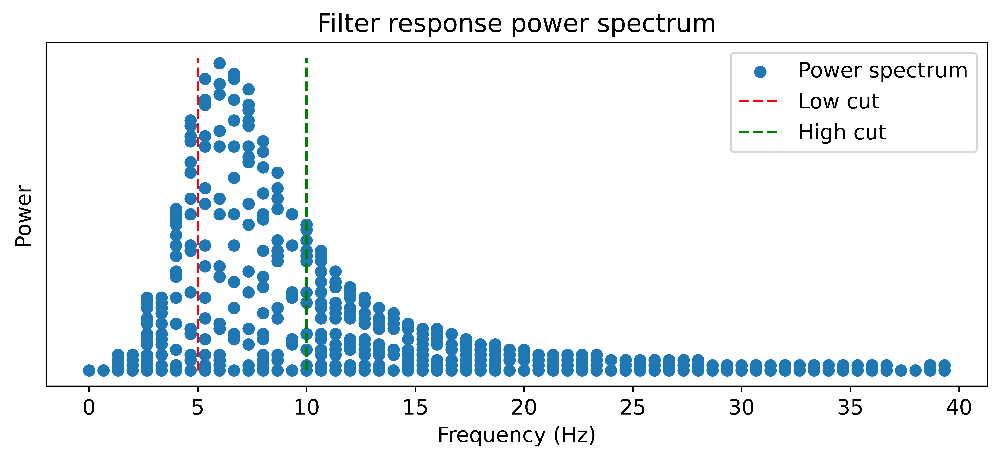

In [20]:
## - Compute and plot a power spectrum

# - Compute a response power spectrum
hist, fbins, abins = np.histogram2d(freq, np.flip(resp[len(times)-1:-1]) ** 2, 60)
f_ind, a_ind = np.where(hist)

# - Plot the plower spectrum
plt.scatter(fbins[f_ind], abins[a_ind], label = 'Power spectrum')
plt.plot([low_cut, low_cut], abins[[0, -1]], 'r--', label = 'Low cut')
plt.plot([high_cut, high_cut], abins[[0, -1]], 'g--', label = 'High cut')
plt.legend()
plt.yticks([])
plt.title('Filter response power spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power');

### Specifying parameters for a whole filter-bank

In [21]:
# - Specify a filterbank and pass the previous chirp signal through
fb = FilterBank.from_specification(3, (0.1, 5), (10, 20), (20, 40))
resp_fb, _, _ = fb(chirp2)

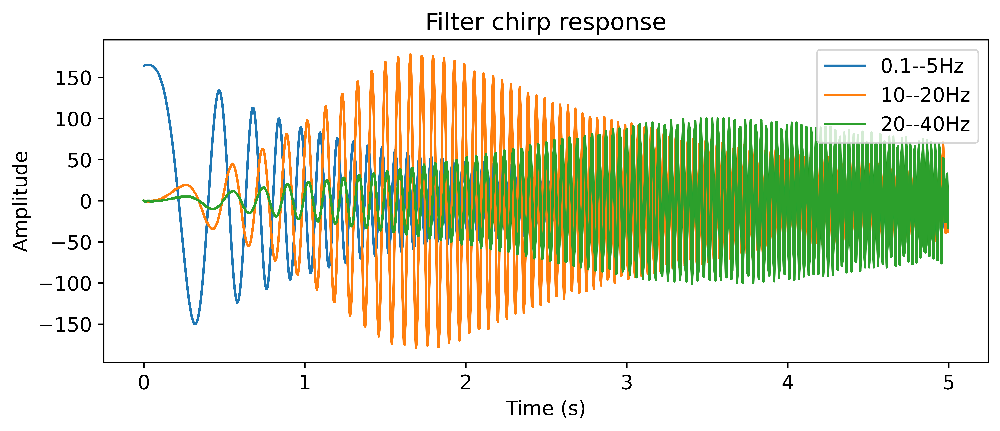

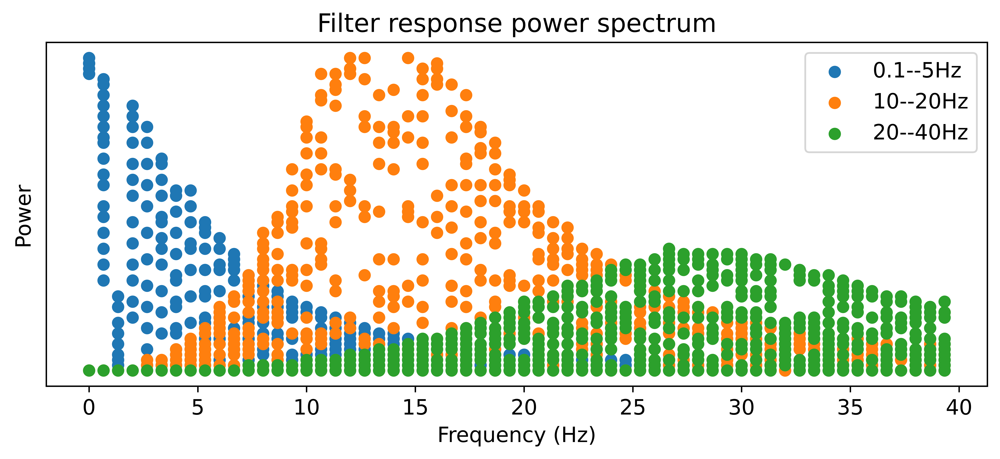

In [22]:
## - Plot the chirp response and frequency power spectra

# - Plot the filter-bank response
plt.figure()
plt.plot(times, np.flip(resp_fb[0, len(times)-1:-1], axis=0), label = ['0.1--5Hz', '10--20Hz', '20--40Hz'])
plt.legend()
plt.title('Filter chirp response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude');

# - Compute a response power spectrum
hist0, _, _ = np.histogram2d(freq, np.flip(resp_fb[0, len(times)-1:-1, 0]) ** 2, [fbins, abins])
hist1, _, _ = np.histogram2d(freq, np.flip(resp_fb[0, len(times)-1:-1, 1]) ** 2, [fbins, abins])
hist2, _, _ = np.histogram2d(freq, np.flip(resp_fb[0, len(times)-1:-1, 2]) ** 2, [fbins, abins])

f_ind0, a_ind0 = np.where(hist0)
f_ind1, a_ind1 = np.where(hist1)
f_ind2, a_ind2 = np.where(hist2)

# - Plot the plower spectrum
plt.figure()
plt.scatter(fbins[f_ind0], abins[a_ind0], label = '0.1--5Hz')
plt.scatter(fbins[f_ind1], abins[a_ind1], label = '10--20Hz')
plt.scatter(fbins[f_ind2], abins[a_ind2], label = '20--40Hz')
plt.legend()
plt.yticks([])
plt.title('Filter response power spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power');

### Applying a filterbank to an IMU signal

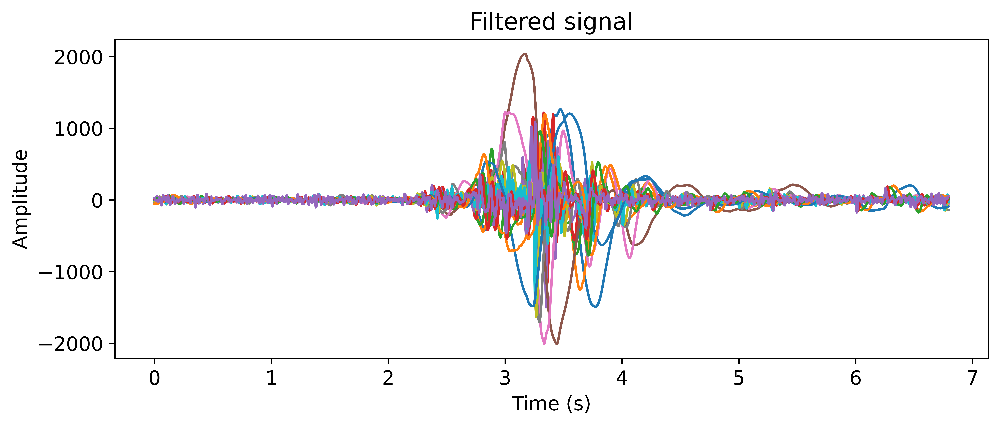

In [23]:
# - Generate a default filterbank
fb = FilterBank()

# - Apply the filterbank to the IMU data
filtered_imu, _, _ = fb(data_corrected)

# - Plot the filter channel outputs
times = np.arange(len(data)) / 200.
plt.plot(times, filtered_imu[0])
plt.title('Filtered signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude');

## Specifying event encoding method and parameters

### Configuring the scale-and-quantise approach

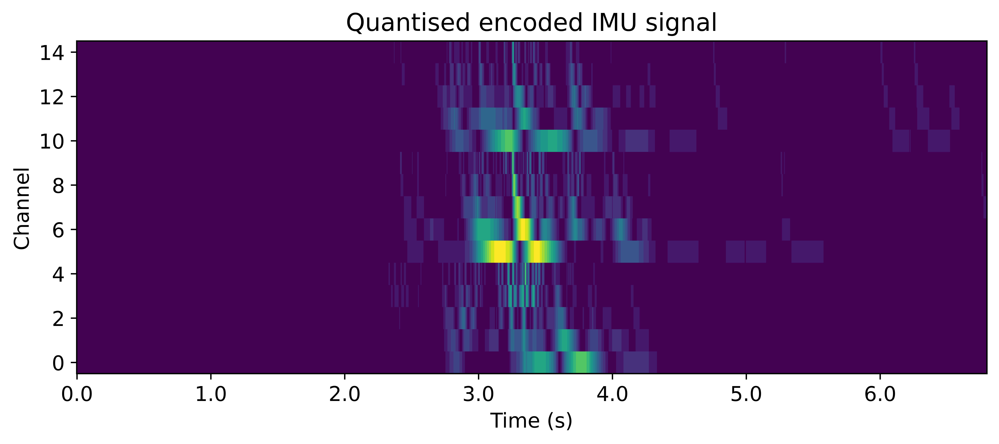

In [24]:
## - Demonstrate the effect of `ScaleSpikeEncoder`

from rockpool.devices.xylo.syns63300.imuif import ScaleSpikeEncoder

scale_encoder = ScaleSpikeEncoder(num_scale_bits=7)
scaled, _, _ = scale_encoder(filtered_imu)

plt.imshow(scaled[0].astype(float).T, aspect='auto', origin='lower', interpolation='none')
xticks, _ = plt.xticks()
xlim = plt.xlim()
plt.xticks(xticks, xticks / Fs)
plt.xlim(xlim)
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Quantised encoded IMU signal');

### Configuring the Integrate-And-Fire encoder

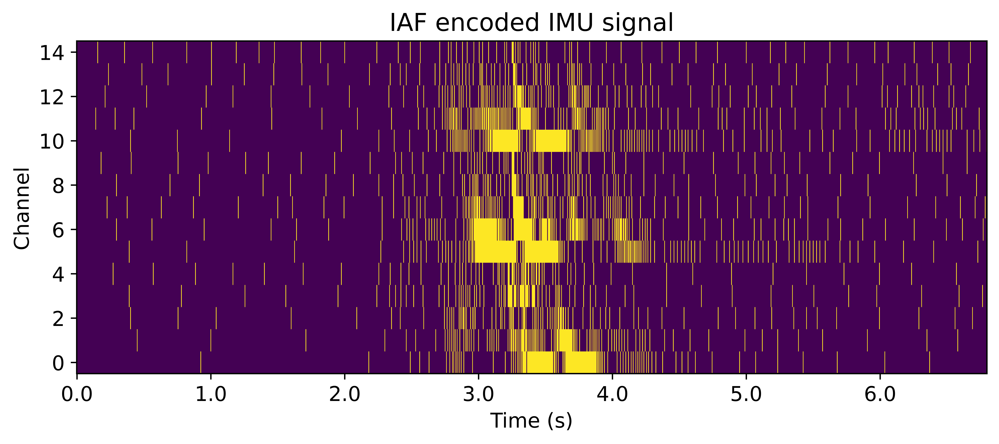

In [25]:
## - Demonstrate the IAF spike encoder
from rockpool.devices.xylo.syns63300.imuif import IAFSpikeEncoder

iaf_encoder = IAFSpikeEncoder(threshold = 1024)
encoded, _, _ = iaf_encoder(filtered_imu)

plt.imshow(encoded[0].astype(float).T, aspect='auto', origin='lower', interpolation='none')
xticks, _ = plt.xticks()
xlim = plt.xlim()
plt.xticks(xticks, xticks / Fs)
plt.xlim(xlim)
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('IAF encoded IMU signal');

## Putting it all together

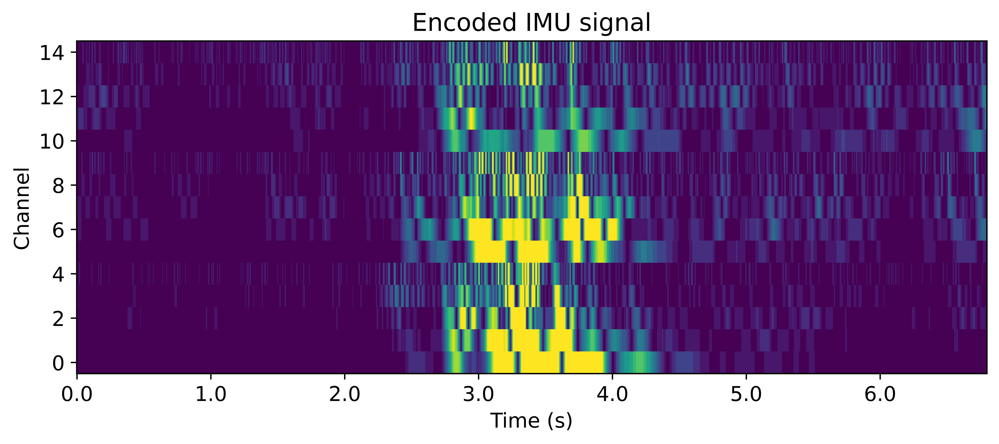

In [26]:
## - Instantiate and demonstrate the IMUIF module

from rockpool.devices.xylo.syns63300 import IMUIFSim

# - Instantiate the IMU IF simulation module
imuif = IMUIFSim()

# - Apply the module to the IMU sample data
encoded, _, _ = imuif(data_quantized)

# - Plot the result
plt.imshow(encoded[0].astype(float).T, aspect = 'auto', interpolation = 'none', origin = 'lower')
xticks, _ = plt.xticks()
xlim = plt.xlim()
plt.xticks(xticks, xticks / Fs)
plt.xlim(xlim)
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Encoded IMU signal');